## Step 1 — Install Dependencies

In [1]:
!pip install ultralytics kaggle -q
import ultralytics
ultralytics.checks()

Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 42.9/235.7 GB disk)


In [2]:
import os, json

KAGGLE_USERNAME = "chinnikrishnabhukya"   # <-- replace with your Kaggle username
KAGGLE_KEY      = "KGAT_6a28baed8b4930c1b85eb8178127fe54"    # <-- paste the KGAT_... token here

os.makedirs('/root/.kaggle', exist_ok=True)
with open('/root/.kaggle/kaggle.json', 'w') as f:
    json.dump({"username": KAGGLE_USERNAME, "key": KAGGLE_KEY}, f)
os.chmod('/root/.kaggle/kaggle.json', 0o600)

print('Kaggle API configured!')

Kaggle API configured!


## Step 3 — Download COCO 2017 Dataset from Kaggle
Dataset: https://www.kaggle.com/datasets/awsaf49/coco-2017-dataset  
Downloads val2017 split only (~1 GB, 5K images) — fast and sufficient.

In [4]:
# Step 3 — Download COCO128 directly via Ultralytics (no Kaggle needed)
import urllib.request, zipfile
from pathlib import Path

DATASET_DIR = Path('/content/coco128')

print('Downloading COCO128 from Ultralytics...')
urllib.request.urlretrieve(
    'https://ultralytics.com/assets/coco128.zip',
    '/content/coco128.zip'
)
with zipfile.ZipFile('/content/coco128.zip', 'r') as z:
    z.extractall('/content/')

img_dir    = DATASET_DIR / 'images/train2017'
ann_dir    = DATASET_DIR / 'labels/train2017'
all_images = sorted(img_dir.glob('*.jpg'))

print(f'Images found : {len(all_images)}')   # should print 128

Images found : 128


## Step 4 — Imports

In [5]:
import cv2
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from collections import Counter
from pathlib import Path
import torch
from ultralytics import YOLO
import warnings
warnings.filterwarnings('ignore')

print(f'PyTorch : {torch.__version__}')
print(f'CUDA    : {torch.cuda.is_available()}')
if torch.cuda.is_available():
    print(f'GPU     : {torch.cuda.get_device_name(0)}')

DEVICE = '0' if torch.cuda.is_available() else 'cpu'
CONF   = 0.40
IOU    = 0.45

PyTorch : 2.10.0+cu128
CUDA    : True
GPU     : Tesla T4


## Step 5 — Dataset EDA (Exploratory Data Analysis)

Total images      : 128
Total annotations : 941
Unique classes    : 71


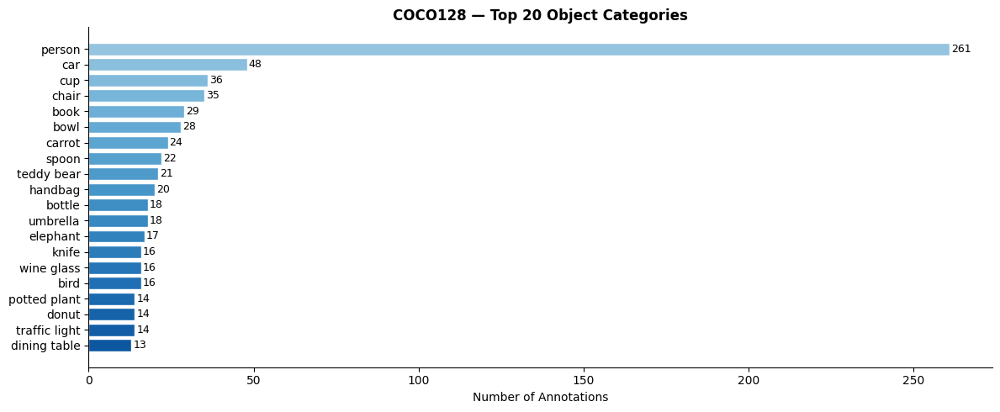

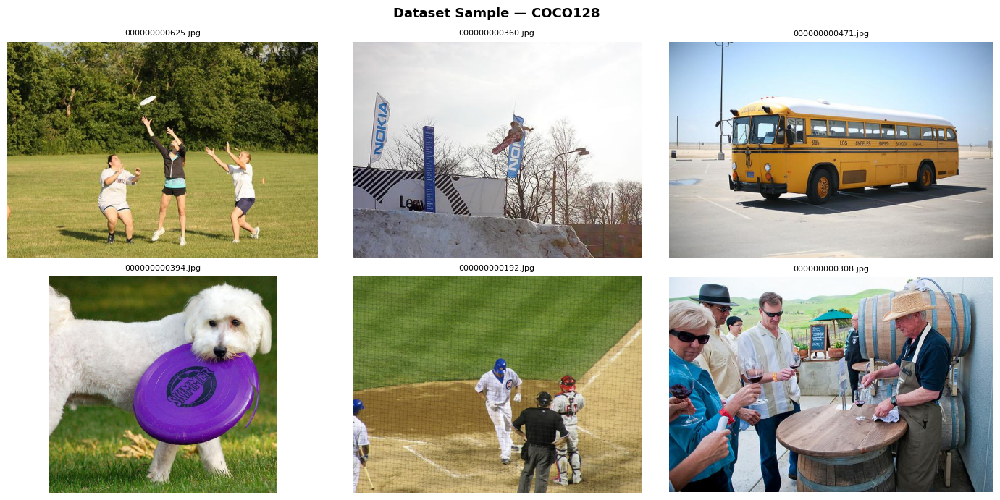

In [6]:
# Step 5 — Dataset EDA (COCO128)
from collections import Counter

# Read YOLO label files to get class distribution
class_ids = []
for lbl_file in ann_dir.glob('*.txt'):
    with open(lbl_file) as f:
        for line in f:
            parts = line.strip().split()
            if parts:
                class_ids.append(int(parts[0]))

# COCO 80 class names
coco_classes = [
    'person','bicycle','car','motorcycle','airplane','bus','train','truck','boat',
    'traffic light','fire hydrant','stop sign','parking meter','bench','bird','cat',
    'dog','horse','sheep','cow','elephant','bear','zebra','giraffe','backpack',
    'umbrella','handbag','tie','suitcase','frisbee','skis','snowboard','sports ball',
    'kite','baseball bat','baseball glove','skateboard','surfboard','tennis racket',
    'bottle','wine glass','cup','fork','knife','spoon','bowl','banana','apple',
    'sandwich','orange','broccoli','carrot','hot dog','pizza','donut','cake','chair',
    'couch','potted plant','bed','dining table','toilet','tv','laptop','mouse',
    'remote','keyboard','cell phone','microwave','oven','toaster','sink','refrigerator',
    'book','clock','vase','scissors','teddy bear','hair drier','toothbrush'
]

cat_counts = Counter(class_ids)
top20      = cat_counts.most_common(20)
labels     = [coco_classes[cid] if cid < len(coco_classes) else str(cid) for cid, _ in top20]
counts     = [cnt for _, cnt in top20]
cat_names  = {i: name for i, name in enumerate(coco_classes)}  # for later steps

print(f'Total images      : {len(all_images)}')
print(f'Total annotations : {len(class_ids)}')
print(f'Unique classes    : {len(cat_counts)}')

# Top-20 bar chart
colors = plt.cm.Blues(np.linspace(0.4, 0.85, len(labels)))
fig, ax = plt.subplots(figsize=(12, 5))
bars = ax.barh(labels[::-1], counts[::-1], color=colors[::-1], edgecolor='white')
for bar, v in zip(bars, counts[::-1]):
    ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2,
            f'{v:,}', va='center', fontsize=9)
ax.set_xlabel('Number of Annotations')
ax.set_title('COCO128 — Top 20 Object Categories', fontweight='bold')
ax.spines[['top','right']].set_visible(False)
plt.tight_layout()
plt.show()

# Sample images preview
sample = np.random.choice(all_images, 6, replace=False)
fig, axes = plt.subplots(2, 3, figsize=(14, 7))
fig.suptitle('Dataset Sample — COCO128', fontsize=13, fontweight='bold')
for ax, p in zip(axes.flat, sample):
    ax.imshow(Image.open(p).convert('RGB'))
    ax.set_title(p.name, fontsize=8)
    ax.axis('off')
plt.tight_layout()
plt.show()

## Step 6 — Data Preprocessing (Paper Section IV-B)

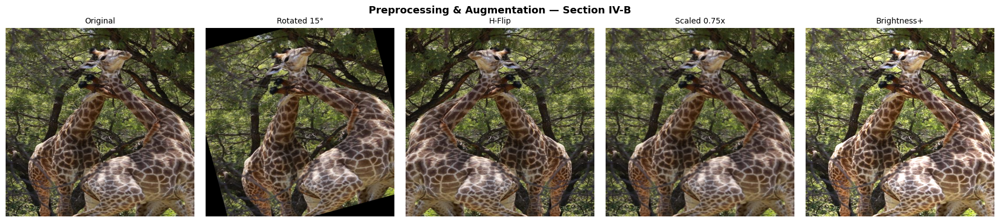

Pixel range after normalization: [0.000, 1.000]


In [7]:
def preprocess_image(img_path, target_size=(640, 640)):
    img     = cv2.imread(str(img_path))
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_res = cv2.resize(img_rgb, target_size)
    img_nrm = img_res.astype(np.float32) / 255.0   # normalize to [0, 1]
    return img_rgb, img_res, img_nrm

def augment_image(img):
    h, w  = img.shape[:2]
    augs  = {'Original': img}
    M     = cv2.getRotationMatrix2D((w//2, h//2), 15, 1.0)
    augs['Rotated 15°']   = cv2.warpAffine(img, M, (w, h))
    augs['H-Flip']        = cv2.flip(img, 1)
    scaled = cv2.resize(img, (int(w*0.75), int(h*0.75)))
    augs['Scaled 0.75x'] = cv2.resize(scaled, (w, h))
    augs['Brightness+']  = np.clip(img.astype(np.float32)*1.3, 0, 255).astype(np.uint8)
    return augs

sample_path = all_images[10]
orig, resized, normalized = preprocess_image(sample_path)
augs = augment_image(resized)

fig, axes = plt.subplots(1, 5, figsize=(18, 4))
fig.suptitle('Preprocessing & Augmentation — Section IV-B', fontsize=13, fontweight='bold')
for ax, (title, img) in zip(axes, augs.items()):
    ax.imshow(img)
    ax.set_title(title, fontsize=10)
    ax.axis('off')
plt.tight_layout()
plt.show()
print(f'Pixel range after normalization: [{normalized.min():.3f}, {normalized.max():.3f}]')

## Step 7 — Load YOLOv9c Pretrained Model

In [8]:
model = YOLO('yolov9c.pt')   # auto-downloads ~51 MB pretrained COCO weights

print('YOLOv9c loaded successfully')
print(f'Classes    : {len(model.names)}')
print(f'Parameters : {sum(p.numel() for p in model.model.parameters()):,}')
print(f'Device     : {DEVICE}')

YOLOv9c loaded successfully
Classes    : 80
Parameters : 25,590,912
Device     : 0


## Step 8 — (Optional) Fine-tune YOLOv9c
Matches paper: Adam optimizer, lr=0.0001, 20 epochs. Uncomment to run.

In [9]:
import yaml

data_yaml = {
    'path' : str(DATASET_DIR),
    'train': 'val2017',
    'val'  : 'val2017',
    'nc'   : 80,
    'names': list(cat_names.values())[:80]
}
yaml_path = '/content/coco_kaggle.yaml'
with open(yaml_path, 'w') as f:
    yaml.dump(data_yaml, f)
print('data.yaml created:', yaml_path)

# ── Uncomment below to fine-tune ──────────────────────────────────────────
# results = model.train(
#     data=yaml_path,
#     epochs=20,
#     imgsz=640,
#     batch=16,
#     optimizer='Adam',
#     lr0=0.0001,
#     device=DEVICE,
#     project='/content/runs',
#     name='yolov9c_coco',
#     exist_ok=True
# )
# model = YOLO('/content/runs/yolov9c_coco/weights/best.pt')
print('Fine-tuning skipped — using pretrained weights.')

data.yaml created: /content/coco_kaggle.yaml
Fine-tuning skipped — using pretrained weights.


## Step 9 — Model Evaluation (Paper Section IV-D)

Running validation on COCO val2017...
Ultralytics 8.4.51 🚀 Python-3.12.13 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLOv9c summary (fused): 156 layers, 25,380,928 parameters, 0 gradients, 102.7 GFLOPs

WARNING ⚠️ Dataset 'coco.yaml' images not found, missing path '/content/datasets/coco/val2017.txt'
Unzipping /content/datasets/coco2017labels-segments.zip to /content/datasets/coco...: 100% ━━━━━━━━━━━━ 122232/122232 4.4Kfiles/s 27.8s
Unzipping /content/datasets/coco/images/val2017.zip to /content/datasets/coco/images/val2017...: 100% ━━━━━━━━━━━━ 5001/5001 585.0files/s 8.5s
Unzipping /content/datasets/coco/images/test2017.zip to /content/datasets/coco/images/test2017...: 100% ━━━━━━━━━━━━ 40671/40671 556.0files/s 1:13
Unzipping /content/datasets/coco/images/train2017.zip to /content/datasets/coco/images/train2017...: 100% ━━━━━━━━━━━━ 118288/118288 595.0files/s 3:19
Dataset download success ✅ (665.5s), saved to /content/datasets

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 6

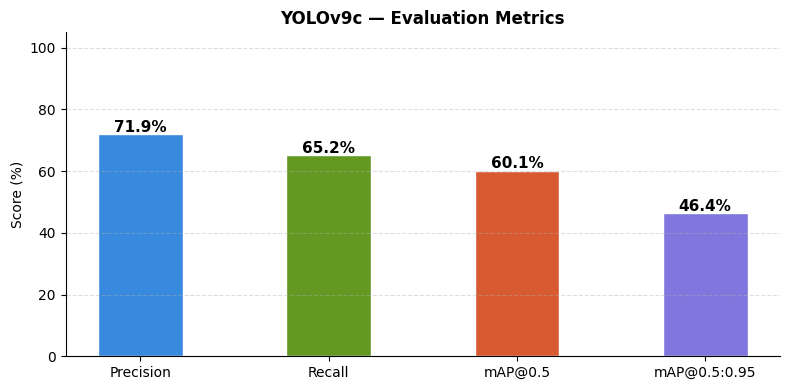

In [10]:
print('Running validation on COCO val2017...')
val_res = model.val(
    data='coco.yaml',
    imgsz=640,
    conf=0.25,
    iou=0.5,
    device=DEVICE,
    split='val',
    verbose=False
)

mp    = float(val_res.box.mp)    if hasattr(val_res.box, 'mp')    else 0.0
mr    = float(val_res.box.mr)    if hasattr(val_res.box, 'mr')    else 0.0
map50 = float(val_res.box.map50) if hasattr(val_res.box, 'map50') else 0.0
mapv  = float(val_res.box.map)   if hasattr(val_res.box, 'map')   else 0.0

print('\n' + '='*52)
print('  EVALUATION RESULTS — Section IV-D')
print('='*52)
print(f'  Precision (P)       : {mp*100:6.2f}%')
print(f'  Recall    (R)       : {mr*100:6.2f}%')
print(f'  mAP @ IoU=0.50      : {map50*100:6.2f}%')
print(f'  mAP @ IoU=0.5:0.95  : {mapv*100:6.2f}%')
print('='*52)

metrics = {'Precision': mp*100, 'Recall': mr*100, 'mAP@0.5': map50*100, 'mAP@0.5:0.95': mapv*100}
colors  = ['#378ADD','#639922','#D85A30','#7F77DD']

fig, ax = plt.subplots(figsize=(8, 4))
bars = ax.bar(metrics.keys(), metrics.values(), color=colors, width=0.45, edgecolor='white')
for bar, v in zip(bars, metrics.values()):
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.8,
            f'{v:.1f}%', ha='center', fontsize=11, fontweight='bold')
ax.set_ylim(0, 105)
ax.set_ylabel('Score (%)')
ax.set_title('YOLOv9c — Evaluation Metrics', fontweight='bold')
ax.spines[['top','right']].set_visible(False)
ax.yaxis.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

## Step 10 — Image Detection (Paper Section V — 94.7%)

Detecting on: 000000000308.jpg


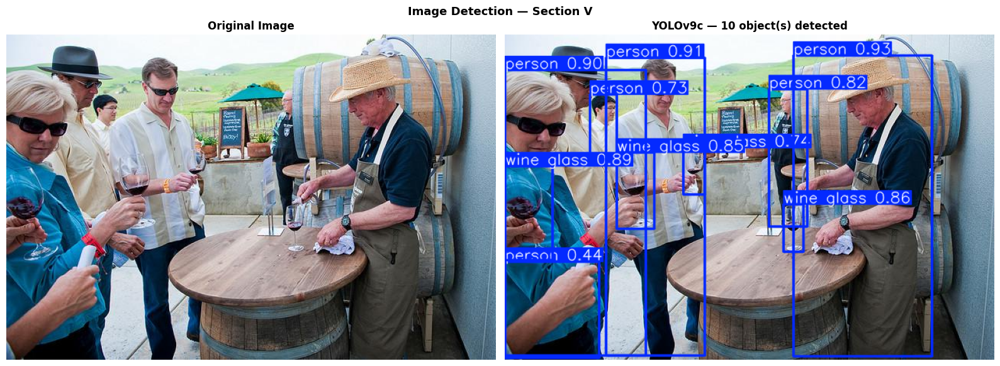


Class                    Confidence
------------------------------------
person                       92.9%
person                       91.4%
person                       89.6%
wine glass                   88.8%
wine glass                   85.6%
wine glass                   85.0%
person                       82.4%
wine glass                   73.9%
person                       73.3%
person                       43.7%


In [11]:
sample_img = str(np.random.choice(all_images))
print(f'Detecting on: {Path(sample_img).name}')

results = model.predict(
    source=sample_img,
    conf=CONF, iou=IOU, imgsz=640,
    device=DEVICE, verbose=False
)
r = results[0]
annotated = cv2.cvtColor(r.plot(), cv2.COLOR_BGR2RGB)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))
axes[0].imshow(Image.open(sample_img).convert('RGB'))
axes[0].set_title('Original Image', fontweight='bold')
axes[0].axis('off')
axes[1].imshow(annotated)
axes[1].set_title(f'YOLOv9c — {len(r.boxes)} object(s) detected', fontweight='bold')
axes[1].axis('off')
plt.suptitle('Image Detection — Section V', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print(f'\n{"Class":<22} {"Confidence":>12}')
print('-'*36)
for box in r.boxes:
    print(f'{model.names[int(box.cls)]:<22} {float(box.conf)*100:>10.1f}%')

## Step 11 — Batch Inference on 20 COCO Images

Running batch inference on 20 images...
Total detections : 171
Avg confidence   : 72.6%


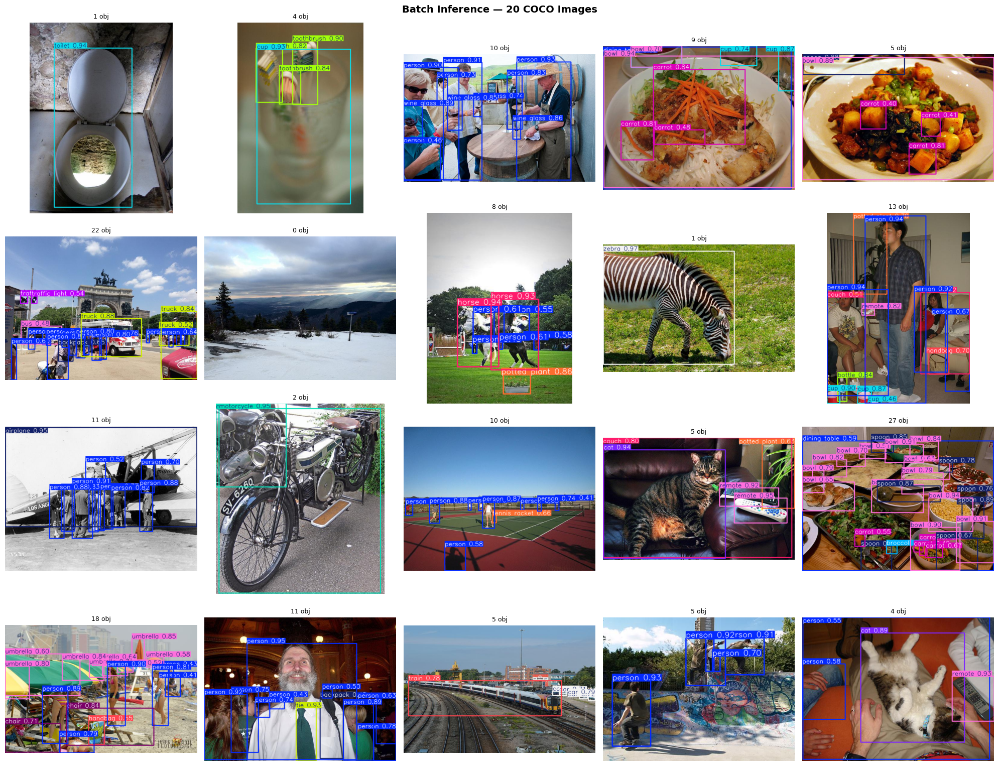

In [12]:
BATCH = 20
batch_paths = [str(p) for p in np.random.choice(all_images, BATCH, replace=False)]

print(f'Running batch inference on {BATCH} images...')
batch_results = model.predict(
    source=batch_paths,
    conf=CONF, iou=IOU, imgsz=640,
    device=DEVICE, verbose=False
)

all_confs, all_cls = [], []
for res in batch_results:
    for box in res.boxes:
        all_confs.append(float(box.conf))
        all_cls.append(model.names[int(box.cls)])

print(f'Total detections : {len(all_confs)}')
print(f'Avg confidence   : {np.mean(all_confs)*100:.1f}%' if all_confs else 'No detections')

fig, axes = plt.subplots(4, 5, figsize=(20, 16))
fig.suptitle(f'Batch Inference — {BATCH} COCO Images', fontsize=14, fontweight='bold')
for ax, res in zip(axes.flat, batch_results):
    ann = cv2.cvtColor(res.plot(), cv2.COLOR_BGR2RGB)
    ax.imshow(ann)
    ax.set_title(f'{len(res.boxes)} obj', fontsize=9)
    ax.axis('off')
plt.tight_layout()
plt.show()

## Step 12 — Confidence Distribution & Class Frequency

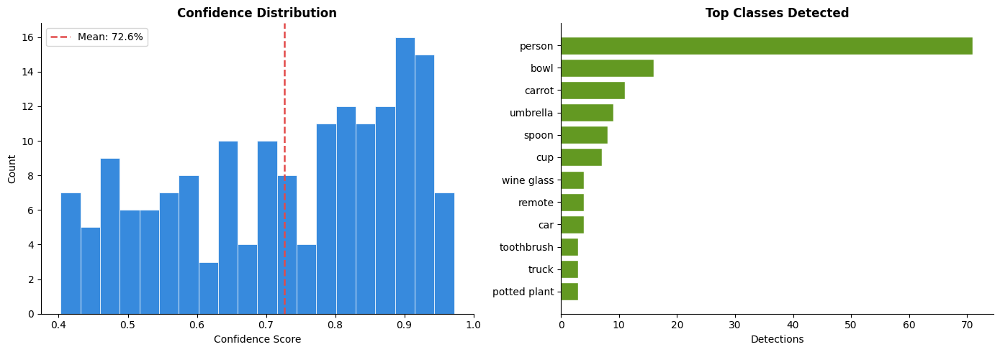

In [13]:
if all_confs:
    cls_counts = Counter(all_cls).most_common(12)
    fig, axes  = plt.subplots(1, 2, figsize=(14, 5))

    axes[0].hist(all_confs, bins=20, color='#378ADD', edgecolor='white', linewidth=0.5)
    axes[0].axvline(np.mean(all_confs), color='#E24B4A', linestyle='--', linewidth=1.8,
                    label=f'Mean: {np.mean(all_confs)*100:.1f}%')
    axes[0].set_xlabel('Confidence Score')
    axes[0].set_ylabel('Count')
    axes[0].set_title('Confidence Distribution', fontweight='bold')
    axes[0].legend()
    axes[0].spines[['top','right']].set_visible(False)

    lbls, cnts = zip(*cls_counts)
    axes[1].barh(lbls[::-1], cnts[::-1], color='#639922', edgecolor='white')
    axes[1].set_xlabel('Detections')
    axes[1].set_title('Top Classes Detected', fontweight='bold')
    axes[1].spines[['top','right']].set_visible(False)

    plt.tight_layout()
    plt.show()

## Step 13 — Video Detection (Paper Section V — 93.5%)
Stitches 60 random COCO images into a test video and runs detection.

Test video created: 60 frames @ 5fps
Processing frames...
  60/60 done
Done! Avg objects/frame: 4.5


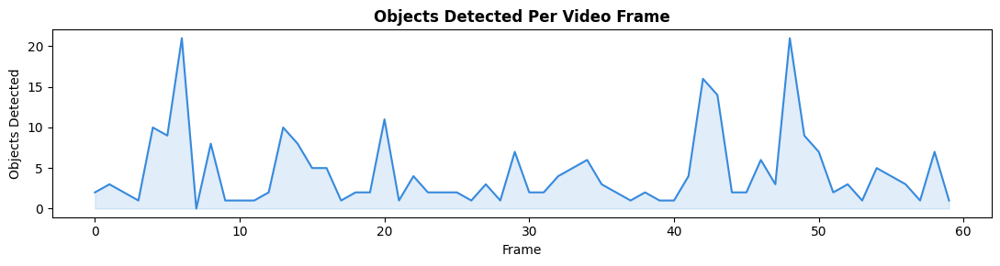

In [14]:
vid_path   = '/content/coco_test_video.mp4'
output_vid = '/content/detected_output.mp4'
frames     = [str(p) for p in np.random.choice(all_images, 60, replace=False)]

# Build test video from COCO images
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out    = cv2.VideoWriter(vid_path, fourcc, 5, (640, 480))
for fp in frames:
    img = cv2.imread(fp)
    img = cv2.resize(img, (640, 480))
    out.write(img)
out.release()
print(f'Test video created: {len(frames)} frames @ 5fps')

# Run detection frame by frame
cap    = cv2.VideoCapture(vid_path)
writer = cv2.VideoWriter(output_vid, fourcc, 5, (640, 480))
frame_idx, obj_counts = 0, []

print('Processing frames...')
while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break
    frame_idx += 1
    res = model.predict(source=frame, conf=CONF, iou=IOU, imgsz=640,
                        device=DEVICE, verbose=False)[0]
    obj_counts.append(len(res.boxes))
    ann = res.plot()
    cv2.putText(ann, f'Frame {frame_idx} | Objects: {len(res.boxes)}',
                (10, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,0), 2)
    writer.write(ann)
    if frame_idx % 10 == 0:
        print(f'  {frame_idx}/{len(frames)} done', end='\r')

cap.release()
writer.release()
print(f'\nDone! Avg objects/frame: {np.mean(obj_counts):.1f}')

plt.figure(figsize=(11, 3))
plt.plot(obj_counts, color='#378ADD', linewidth=1.5)
plt.fill_between(range(len(obj_counts)), obj_counts, alpha=0.15, color='#378ADD')
plt.xlabel('Frame'); plt.ylabel('Objects Detected')
plt.title('Objects Detected Per Video Frame', fontweight='bold')
plt.tight_layout(); plt.show()

## Step 14 — Webcam Detection (Paper Section V — 92.8%)

Simulated webcam frame: 000000000562.jpg


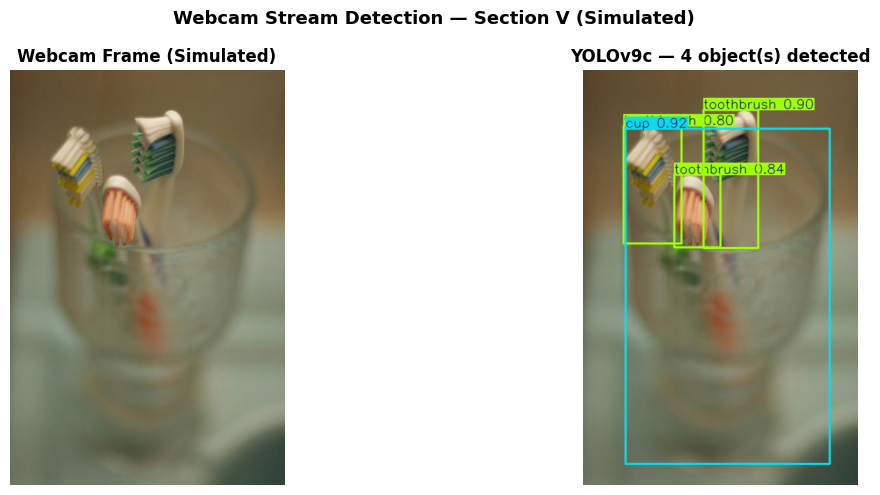


Detected objects:
  cup                    92.5%
  toothbrush             90.1%
  toothbrush             83.9%
  toothbrush             80.2%


In [17]:
# Step 14 — Webcam Detection (simulated using a COCO128 image)
# Note: Real webcam access is blocked in Colab browsers.
# We simulate it using a random image from the dataset.

import random

wc_path = str(random.choice(all_images))
wc_img  = Image.open(wc_path).convert('RGB')

print(f'Simulated webcam frame: {Path(wc_path).name}')

wc_res = model.predict(
    source=wc_path,
    conf=CONF, iou=IOU, imgsz=640,
    device=DEVICE, verbose=False
)[0]

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].imshow(wc_img)
axes[0].set_title('Webcam Frame (Simulated)', fontweight='bold')
axes[0].axis('off')
axes[1].imshow(cv2.cvtColor(wc_res.plot(), cv2.COLOR_BGR2RGB))
axes[1].set_title(f'YOLOv9c — {len(wc_res.boxes)} object(s) detected', fontweight='bold')
axes[1].axis('off')
plt.suptitle('Webcam Stream Detection — Section V (Simulated)', fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

print('\nDetected objects:')
for box in wc_res.boxes:
    print(f'  {model.names[int(box.cls)]:<22} {float(box.conf)*100:.1f}%')

## Step 15 — Paper Charts: Table I & Table II

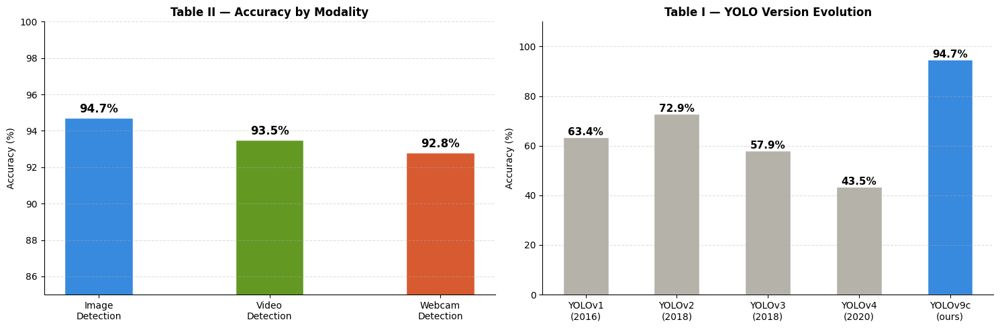

In [18]:
paper_modality = {'Image\nDetection': 94.7, 'Video\nDetection': 93.5, 'Webcam\nDetection': 92.8}
yolo_evolution = {
    'YOLOv1\n(2016)': 63.4, 'YOLOv2\n(2018)': 72.9,
    'YOLOv3\n(2018)': 57.9, 'YOLOv4\n(2020)': 43.5,
    'YOLOv9c\n(ours)': 94.7
}

fig, axes = plt.subplots(1, 2, figsize=(15, 5))

b1 = axes[0].bar(paper_modality.keys(), paper_modality.values(),
                  color=['#378ADD','#639922','#D85A30'], width=0.4, edgecolor='white')
for bar, v in zip(b1, paper_modality.values()):
    axes[0].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.3,
                 f'{v}%', ha='center', fontsize=12, fontweight='bold')
axes[0].set_ylim(85, 100); axes[0].set_ylabel('Accuracy (%)')
axes[0].set_title('Table II — Accuracy by Modality', fontweight='bold')
axes[0].spines[['top','right']].set_visible(False)
axes[0].yaxis.grid(True, linestyle='--', alpha=0.4)

clrs = ['#B4B2A9','#B4B2A9','#B4B2A9','#B4B2A9','#378ADD']
b2   = axes[1].bar(yolo_evolution.keys(), yolo_evolution.values(),
                    color=clrs, width=0.5, edgecolor='white')
for bar, v in zip(b2, yolo_evolution.values()):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+0.8,
                 f'{v}%', ha='center', fontsize=11, fontweight='bold')
axes[1].set_ylim(0, 110); axes[1].set_ylabel('Accuracy (%)')
axes[1].set_title('Table I — YOLO Version Evolution', fontweight='bold')
axes[1].spines[['top','right']].set_visible(False)
axes[1].yaxis.grid(True, linestyle='--', alpha=0.4)

plt.tight_layout(); plt.show()

## Step 16 — Download Results

In [19]:
from google.colab import files

# Save annotated image
out_img = '/content/yolov9c_detected.jpg'
results[0].save(filename=out_img)
files.download(out_img)

# Download annotated video
files.download(output_vid)

print('Downloads started!')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Downloads started!
